# Explore Party Manifestos

In [1]:
import pandas as pd

In [8]:
manifesto_df = pd.read_csv("../data/german_manifestos.csv")

In [9]:
manifesto_df

,partyID,party,year,manifest_text,manifest_tokens
0,41113,90/Greens,2017,"A. EINLEITUNG Liebe Bürgerinnen und Bürger,am ...","[{'text': 'A. EINLEITUNG', 'cmp_code': 'H', 'e..."
1,41113,90/Greens,2021,"Eine Einladung Liebe Wähler*innen, durch Wahle...","[{'text': 'Eine Einladung', 'cmp_code': 'H', '..."
2,41223,LINKE,2017,"Die Zukunft, für die wir kämpfen: SOZIAL. GERE...","[{'text': 'Die Zukunft, für die wir kämpfen: S..."
3,41223,LINKE,2021,Einführung Es kommt auf uns alle an. Es kommt ...,"[{'text': 'Einführung', 'cmp_code': 'H', 'eu_c..."
4,41320,SPD,2017,Es ist Zeit für mehr Gerechtigkeit! 2017 ist e...,[{'text': 'Es ist Zeit für mehr Gerechtigkeit!...
5,41320,SPD,2021,1.0.Zukunft. Respekt. Europa. Am Anfang des dr...,"[{'text': '1.0.Zukunft.', 'cmp_code': 'H', 'eu..."
6,41420,FDP,2017,Schauen wir nicht länger zu! Wir sehen die Her...,"[{'text': 'Schauen wir nicht länger zu!', 'cmp..."
7,41420,FDP,2021,Das Programm der Freien Demokraten zur Bundest...,[{'text': 'Das Programm der Freien Demokraten ...
8,41521,CDU/CSU,2017,Ein gutes Land in dieser Zeit Deutschland ist ...,"[{'text': 'Ein gutes Land in dieser Zeit', 'cm..."
9,41521,CDU/CSU,2021,Einleitung Deutschland ist ein starkes Land. D...,"[{'text': 'Einleitung', 'cmp_code': 'H', 'eu_c..."


In [10]:
import string
# defining normalization of text: converting to lowercase and removing punctuation
def normalize_text(input_str:str):
    return input_str.lower().translate(str.maketrans('','', string.punctuation))


In [14]:
# normalize (remove punctuation, to lower)
manifesto_df['normalized'] = manifesto_df['manifest_text'].apply(normalize_text)
# Tokenized speech
manifesto_df['tokenized'] = manifesto_df['normalized'].str.split()
# length of speech
manifesto_df['speech_length'] = manifesto_df['tokenized'].apply(len)
# vocab of a speech
manifesto_df['vocab'] = manifesto_df['tokenized'].apply(lambda x: set(x))
# vocab size per speech
manifesto_df['vocab_size'] = manifesto_df['vocab'].apply(lambda x: len(x))
# remove stop words
with open("german_stopwords_full.txt", "r", encoding="utf-8") as g:
    german_stopwords_full = [line.strip() for line in g if not line.lstrip().startswith(";")]
print(german_stopwords_full)
manifesto_df['clean_full'] = manifesto_df['tokenized'].apply(lambda tokens: [word for word in tokens if word not in german_stopwords_full and word.isalpha()])


['ab', 'aber', 'abermaliges', 'abermals', 'abgerufen', 'abgerufene', 'abgerufener', 'abgerufenes', 'abgesehen', 'acht', 'aehnlich', 'aehnliche', 'aehnlichem', 'aehnlichen', 'aehnlicher', 'aehnliches', 'aehnlichste', 'aehnlichstem', 'aehnlichsten', 'aehnlichster', 'aehnlichstes', 'aeusserst', 'aeusserste', 'aeusserstem', 'aeussersten', 'aeusserster', 'aeusserstes', 'ähnlich', 'ähnliche', 'ähnlichem', 'ähnlichen', 'ähnlicher', 'ähnliches', 'ähnlichst', 'ähnlichste', 'ähnlichstem', 'ähnlichsten', 'ähnlichster', 'ähnlichstes', 'alle', 'allein', 'alleine', 'allem', 'allemal', 'allen', 'allenfalls', 'allenthalben', 'aller', 'allerdings', 'allerlei', 'alles', 'allesamt', 'allg', 'allg.', 'allgemein', 'allgemeine', 'allgemeinem', 'allgemeinen', 'allgemeiner', 'allgemeines', 'allgemeinste', 'allgemeinstem', 'allgemeinsten', 'allgemeinster', 'allgemeinstes', 'allmählich', 'allzeit', 'allzu', 'als', 'alsbald', 'also', 'am', 'an', 'and', 'andauernd', 'andauernde', 'andauerndem', 'andauernden', 'an

In [ ]:
tokenized = manifesto_df['tokenized'].dropna()

# 1. Total number of speeches
num_speeches = len(tokenized)

# 2. Average speech length (in words)
avg_length = tokenized.apply(len).mean()

# 3. Maximum and minimum speech length
max_length = tokenized.apply(len).max()
min_length = tokenized.apply(len).min()

# 4. Vocabulary size (unique words across all utterances)
all_words = [word for sublist in tokenized for word in sublist]
vocab_size = len(set(all_words))

# 5. Total word count
total_words = len(all_words)

# Show results
print(f"Total number of manifestos: {num_speeches}")
print(f"Average manifesto length (words): {avg_length:.2f}")
print(f"Max manifesto length: {max_length} words")
print(f"Min manifesto length: {min_length} words")
print(f"Total word count: {total_words}")
print(f"Vocabulary size: {vocab_size}")


Total number of manifestos: 12
Average manifesto length (words): 40367.42
Max manifesto length: 68647 words
Min manifesto length: 16056 words
Total word count: 484409
Vocabulary size: 40109


In [18]:
from collections import Counter

# Flatten all tokens into a single list
all_tokens = [token for tokens in manifesto_df['clean_full'] for token in tokens]

# Count word frequencies
word_counts = Counter(all_tokens)

# Get top 10 most common words
top_20 = word_counts.most_common(20)

# Display
for word, count in top_20:
    print(f"{word}: {count}")


menschen: 1698
deutschland: 1282
stärken: 851
unternehmen: 697
schaffen: 686
demokraten: 633
leben: 623
unterstützen: 584
fördern: 582
europäischen: 582
arbeit: 552
europa: 551
gesellschaft: 548
eu: 520
kinder: 511
bildung: 458
frauen: 454
euro: 441
öffentlichen: 438
land: 431


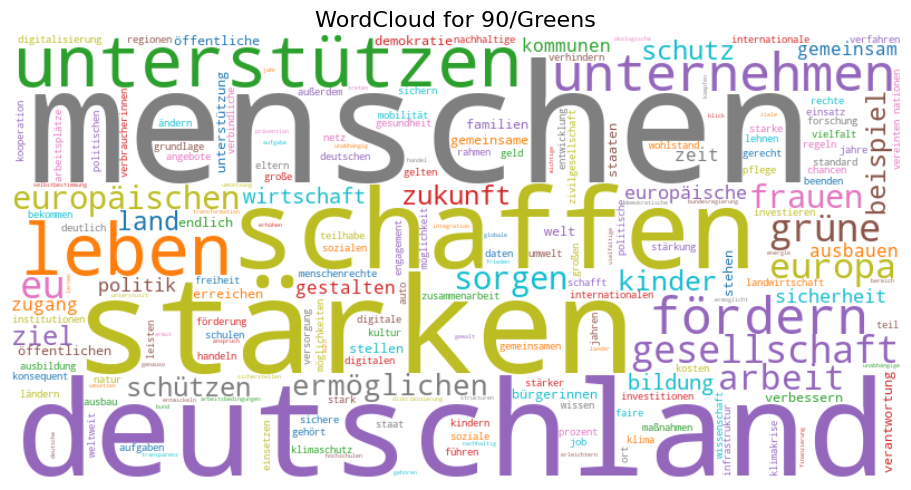

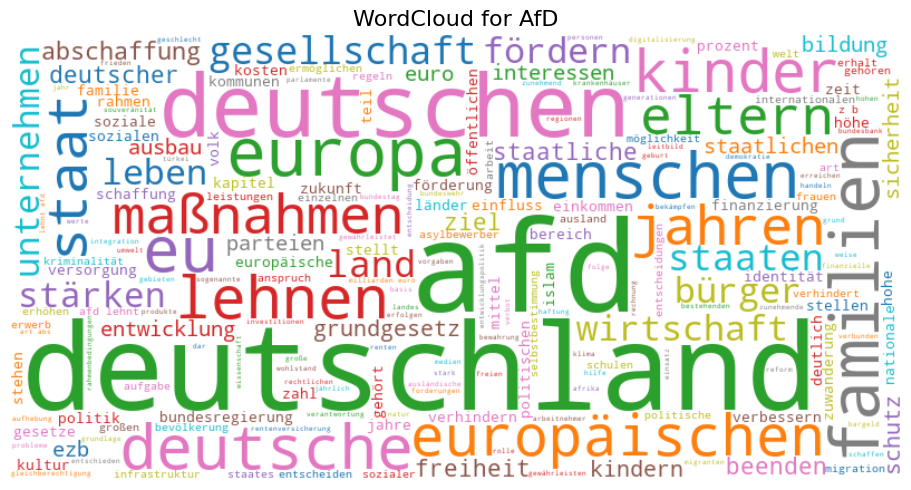

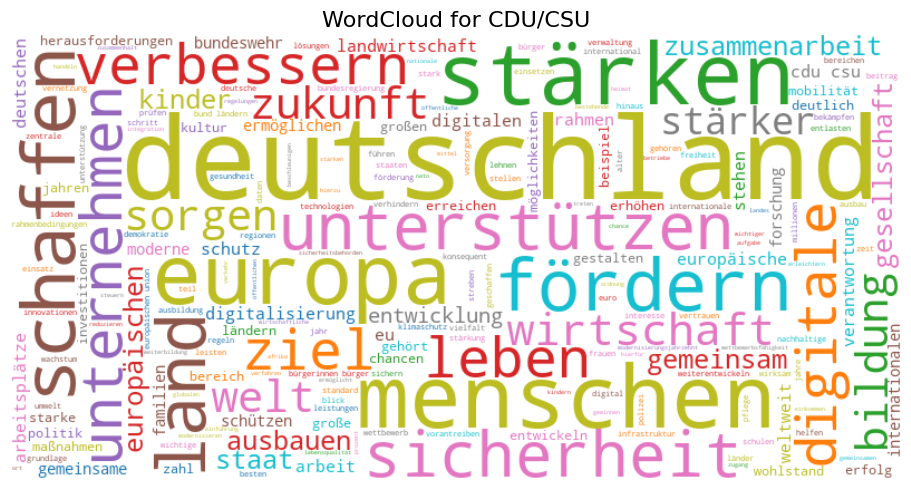

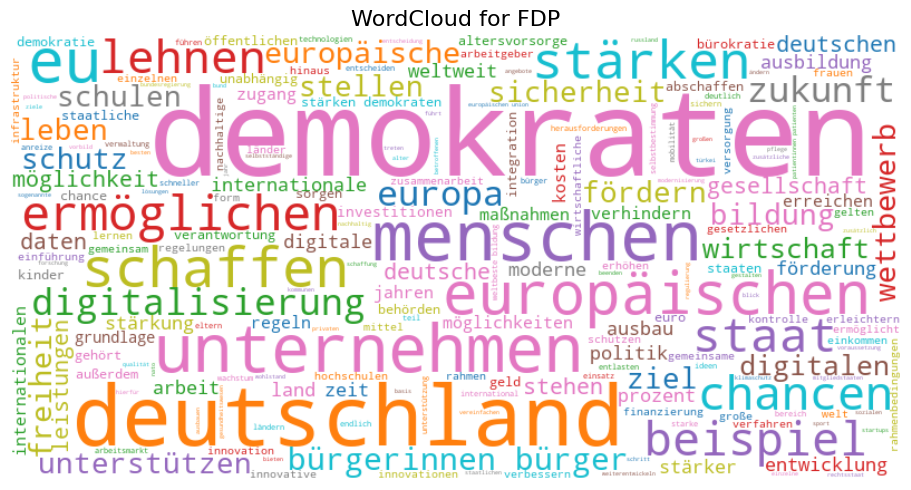

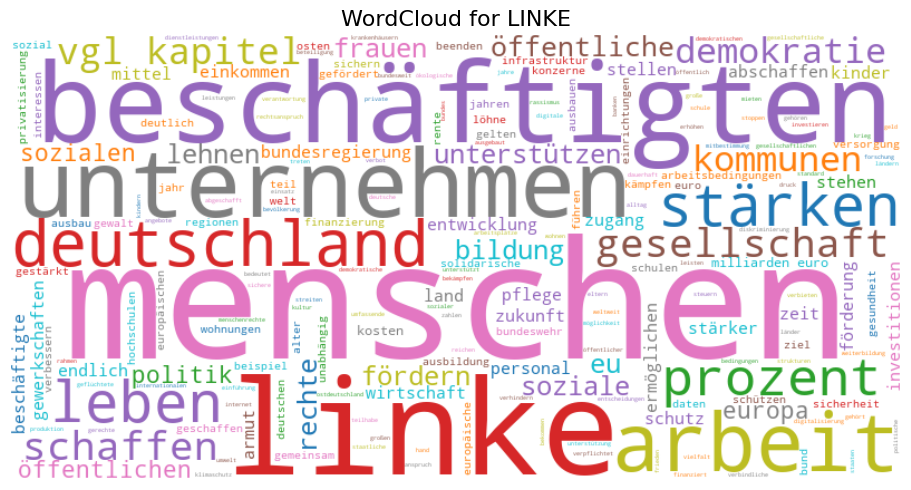

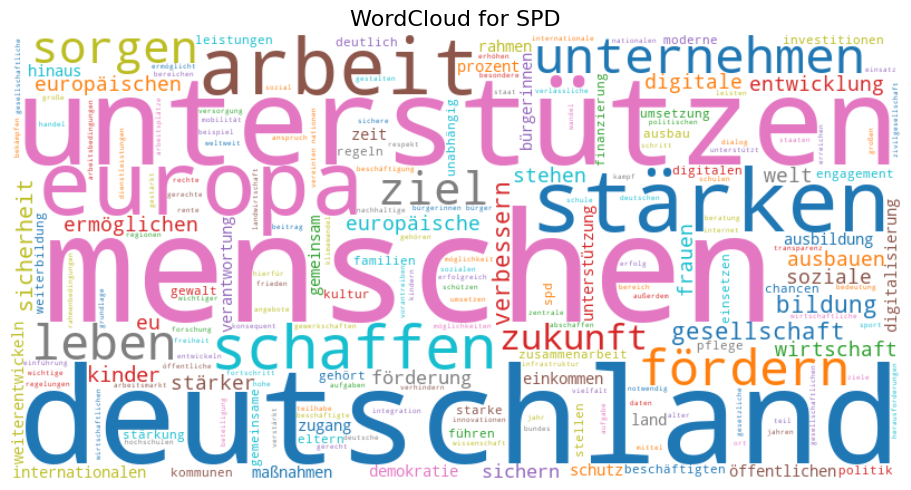

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Group by party and combine all tokens into a single text
party_tokens = manifesto_df.groupby('party')['clean_full'].sum()

# Plot one wordcloud per party
for party, tokens in party_tokens.items():
    # Join tokens into one string
    text = " ".join(tokens)

    # Generate word cloud
    wc = WordCloud(width=800, height=400, background_color='white',
                   colormap='tab10', max_words=200).generate(text)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud for {party}", fontsize=16)
    plt.tight_layout()
    plt.show()

In [ ]:
import ast

manifesto_df['manifest_tokens'] = manifesto_df['manifest_tokens'].apply(ast.literal_eval)
manifesto_df['cmp_codes'] = manifesto_df['manifest_tokens'].apply(lambda x: [item['cmp_code'] for item in x])


In [33]:
mp_v5 = pd.read_csv("../data/codebook_categories_MPDS2020a.csv", dtype={'code':str})

In [36]:
mp_v5_map = {}
for _,row in mp_v5.iterrows():
    mp_v5_map[row['code']] = row['title']

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


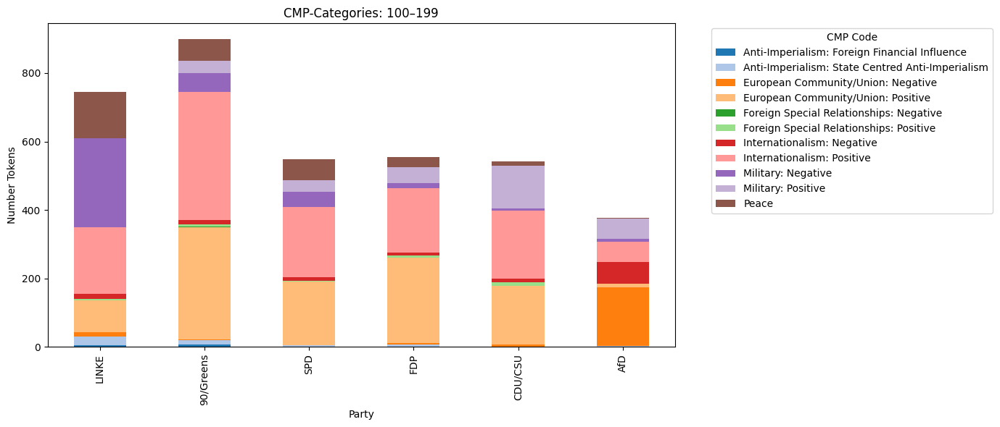

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


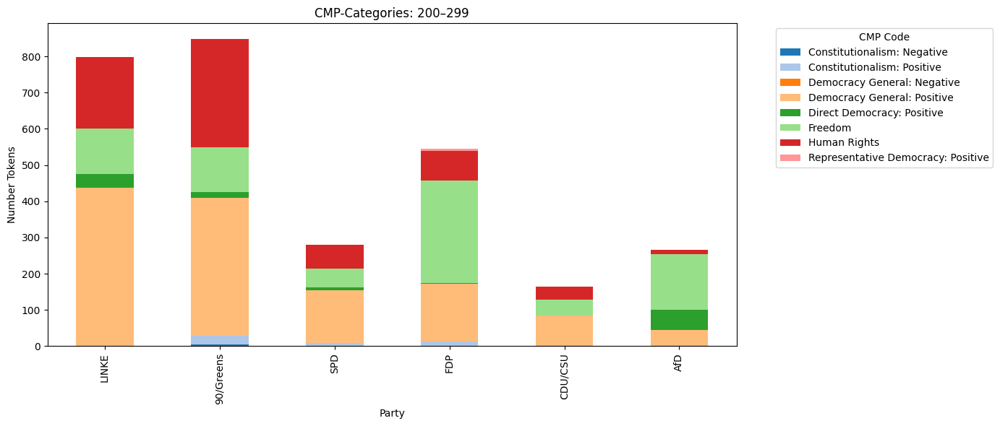

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


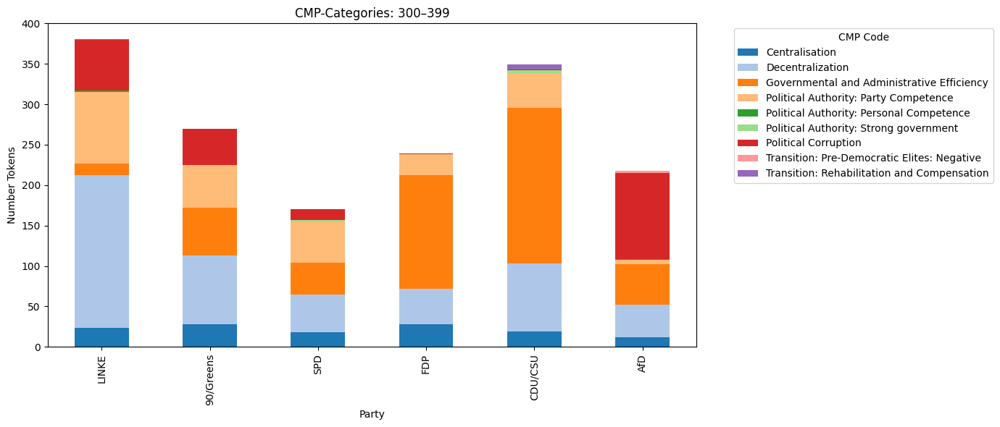

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


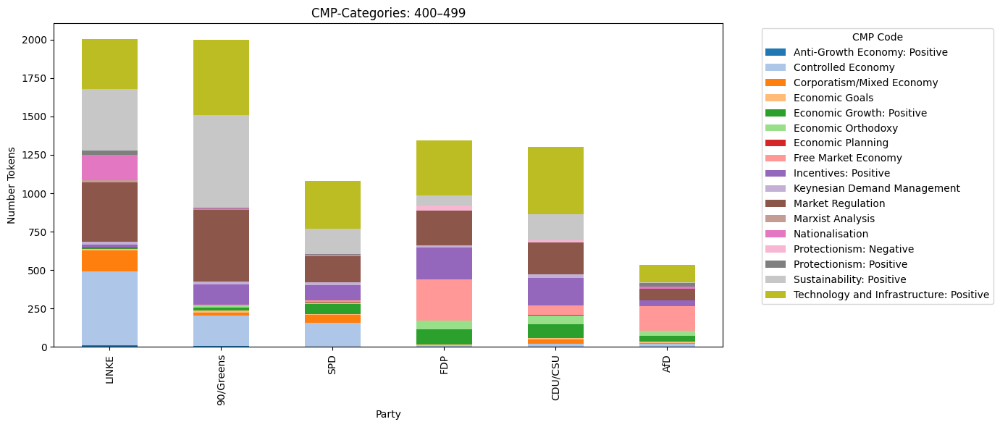

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


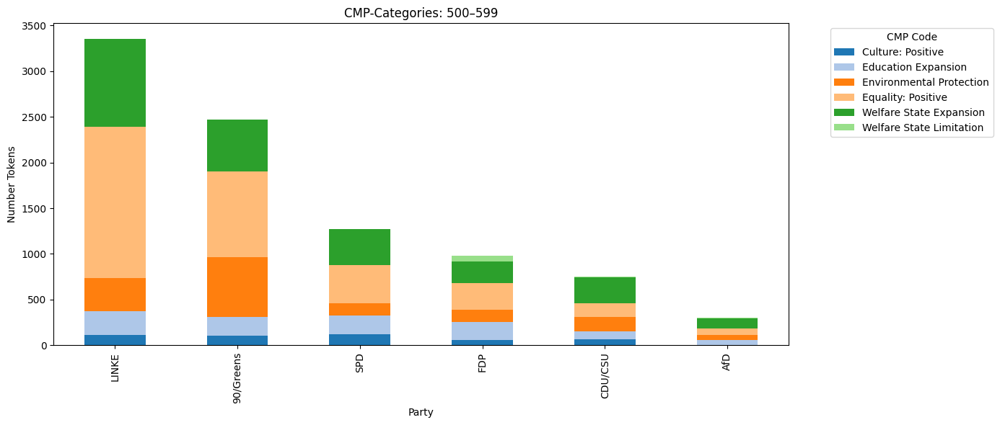

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


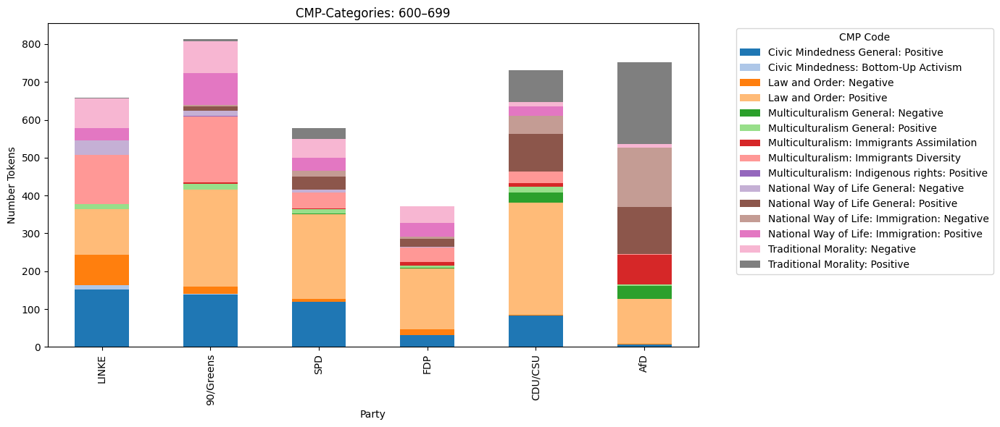

C:\Users\Estelle\AppData\Local\Temp\ipykernel_3504\537566156.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)


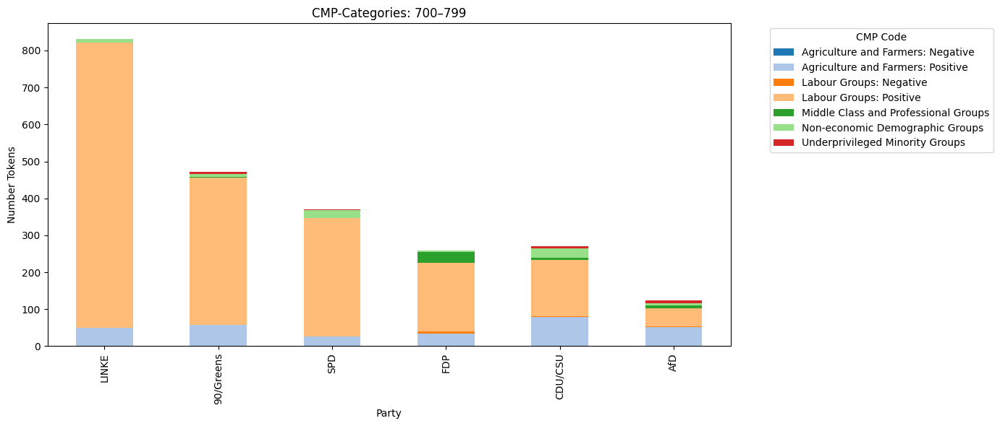

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

# remove 000 (no group), map category names
df_exploded = manifesto_df.explode('cmp_codes')
df_exploded = df_exploded[df_exploded['cmp_codes'] != '000']
df_exploded = df_exploded[df_exploded['cmp_codes'].isin(mp_v5_map.keys())]
df_exploded['cmp_label'] = df_exploded['cmp_codes'].map(mp_v5_map)

# part in groups
def extract_group(code_str):
    match = re.match(r'^(\d+)', code_str)
    if match:
        return int(match.group(1)) // 100 * 100
    return None

df_exploded['code_group'] = df_exploded['cmp_codes'].apply(extract_group)

# list of groups
code_groups = sorted(df_exploded['code_group'].dropna().unique())

# colors
palette_base = sns.color_palette("tab20")

# party order
party_order = ['LINKE', '90/Greens', 'SPD', 'FDP', 'CDU/CSU', 'AfD']
df_exploded['party'] = pd.Categorical(df_exploded['party'], categories=party_order, ordered=True)


# plot per group
for group in code_groups:
    subset = df_exploded[df_exploded['code_group'] == group]
    
    # group: party & label
    counts = subset.groupby(['party', 'cmp_label']).size().unstack(fill_value=0)

    if counts.empty:
        continue  

    # dynamic colorpalette
    labels = counts.columns.tolist()
    palette = palette_base[:len(labels)]

    # Plot
    ax = counts.plot(
        kind='bar',
        stacked=True,
        figsize=(14, 6),
        color=palette,
    )

    plt.title(f'CMP-Categories: {group}–{group+99}')
    plt.ylabel('Number Tokens')
    plt.xlabel('Party')
    plt.legend(title='CMP Code', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
